In [10]:
#!pip install ipywidgets

from diffusers import DiffusionPipeline

model_id = "runwayml/stable-diffusion-v1-5"
pipeline = DiffusionPipeline.from_pretrained(model_id, use_safetensors=True)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

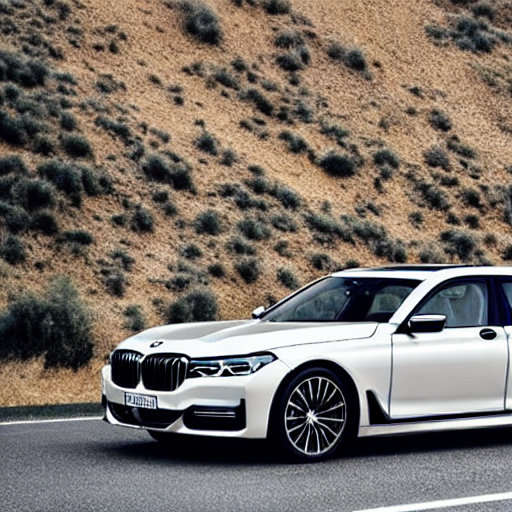

In [11]:
prompt = "A photo of sliver colored bmw 7-series on highway "

# PyTorch 모듈과 동일한 방식으로 GPU에 파이프라인을 배치
pipeline = pipeline.to('cuda')

import torch
# 재현성 확보
generator = torch.Generator("cuda").manual_seed(0)
image = pipeline(prompt, generator=generator).images[0]
image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

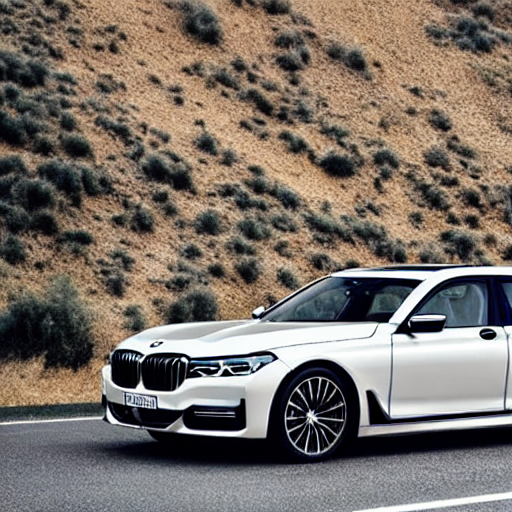

In [12]:
# 더 낮은 정밀도로 변경 (float32 → float16)

import torch

pipeline = DiffusionPipeline.from_pretrained(model_id, 
                                             torch_dtype=torch.float16,  # default float32 
                                             use_safetensors=True)
pipeline = pipeline.to("cuda")
generator = torch.Generator("cuda").manual_seed(0)
image = pipeline(prompt, generator=generator).images[0]
image

[diffusers.schedulers.scheduling_k_dpm_2_ancestral_discrete.KDPM2AncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_k_dpm_2_discrete.KDPM2DiscreteScheduler,
 diffusers.schedulers.scheduling_ddpm.DDPMScheduler,
 diffusers.schedulers.scheduling_euler_ancestral_discrete.EulerAncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_unipc_multistep.UniPCMultistepScheduler,
 diffusers.schedulers.scheduling_heun_discrete.HeunDiscreteScheduler,
 diffusers.utils.dummy_torch_and_scipy_objects.LMSDiscreteScheduler,
 diffusers.schedulers.scheduling_deis_multistep.DEISMultistepScheduler,
 diffusers.schedulers.scheduling_dpmsolver_singlestep.DPMSolverSinglestepScheduler,
 diffusers.utils.dummy_torch_and_torchsde_objects.DPMSolverSDEScheduler,
 diffusers.schedulers.scheduling_ddim.DDIMScheduler,
 diffusers.schedulers.scheduling_euler_discrete.EulerDiscreteScheduler,
 diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler,
 diffusers.schedulers.scheduling_pndm.PN

  0%|          | 0/50 [00:00<?, ?it/s]

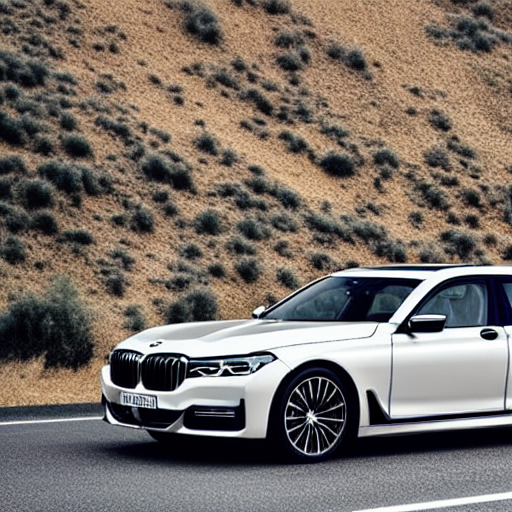

In [13]:
##################################################################################################
# Pipeline 과 호환되는 스케쥴러 확인하고 스케쥴러 변경
##################################################################################################

# [1] 호환되는 스케쥴러 확인
display(pipeline.scheduler.compatibles)

# [2] 스케쥴러를 DPMSolverMultistepScheduler 로 변경
# - StableDiffusion 은 기본으로 PNDMScheduler 를 사용, ~50개의 추론 단계가 필요
# - DPMSolverMultistepScheduler와 같은 성능이 뛰어난 스케줄러는 ~20개 또는 25개의 추론 단계만 필요
from diffusers import DPMSolverMultistepScheduler
pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)

# [3] 변경된 스케쥴러로 이미지 생성
generator = torch.Generator("cuda").manual_seed(0)
image = pipeline(prompt, generator=generator, num_inference_steps=50).images[0]
image


In [14]:
# import torch
# import gc

# pipeline = None

# # 모든 텐서를 삭제합니다.
# gc.collect()

# # PyTorch의 CUDA 캐시를 비웁니다.
# torch.cuda.empty_cache()

# !nvidia-smi

  0%|          | 0/20 [00:00<?, ?it/s]

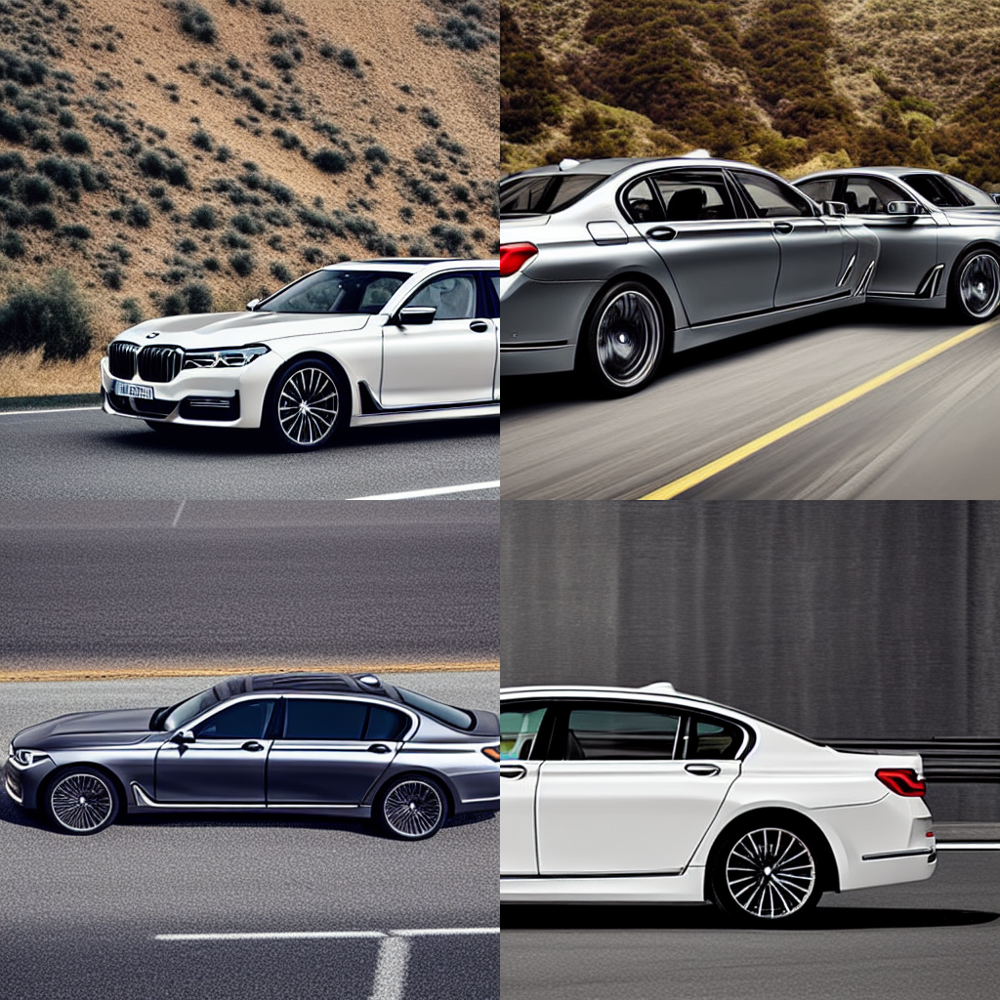

In [15]:
##################################################################################################
# 한 번에 여러개 이미지를 배치로 생성하기 
##################################################################################################

def get_inputs(batch_size=1):
    generator = [torch.Generator("cuda").manual_seed(i) for i in range(batch_size)]
    prompts = batch_size * [prompt]
    num_inference_steps = 20
    return {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}

from diffusers.utils import make_image_grid

images = pipeline(**get_inputs(batch_size=4)).images
make_image_grid(images, 2, 2)

  0%|          | 0/20 [00:00<?, ?it/s]

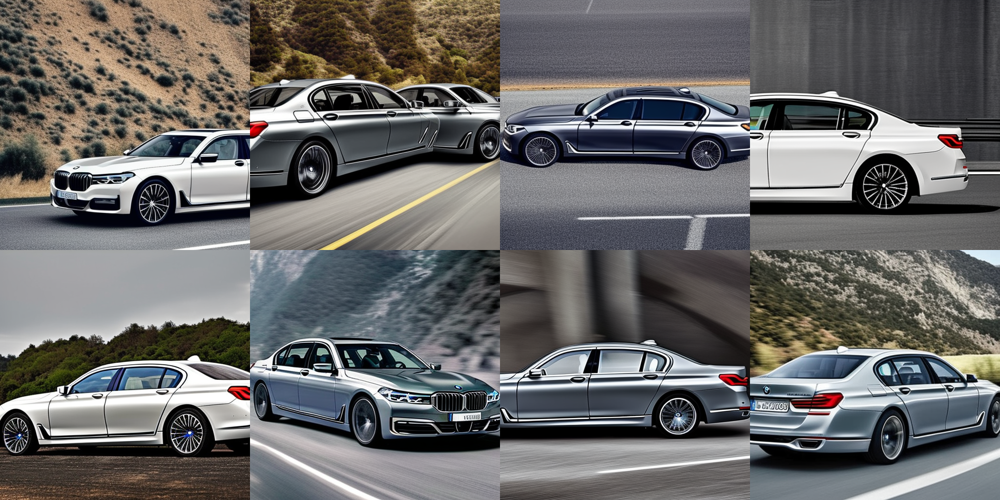

In [16]:
##################################################################################################
# VAE 모듈을 최신 모듈로 변경하기
##################################################################################################
from diffusers import AutoencoderKL

vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse", torch_dtype=torch.float16).to("cuda")
pipeline.vae = vae
images = pipeline(**get_inputs(batch_size=8)).images
make_image_grid(images, rows=2, cols=4)

  0%|          | 0/20 [00:00<?, ?it/s]

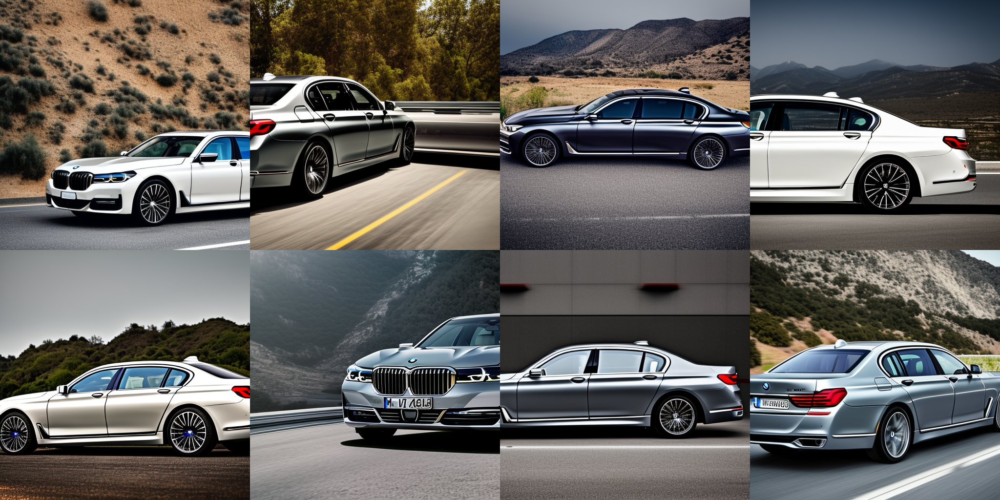

In [17]:
prompt += " 50mm portrait photography, hard rim lighting photography--beta --ar 2:3  --beta --upbeta"
images = pipeline(**get_inputs(batch_size=8)).images
make_image_grid(images, rows=2, cols=4)